## Descriptive Analysis of Spotify dataset
Source: Kaggle, Size: (170653, 19)

### Importing necessary libraries

In [23]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.figure_factory as ff
from scipy.stats import norm
from sklearn.preprocessing import MultiLabelBinarizer 
from wordcloud import WordCloud
import plotly.express as px
from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)

import warnings
warnings.filterwarnings("ignore")

### 1. Visualizing various features and their distibutions
1. 170,000 songs data which has following features:
- Primary:
    - id (Id of track generated by Spotify)
- Numerical:
    - acousticness (Ranges from 0 to 1)
    - danceability (Ranges from 0 to 1)
    - energy (Ranges from 0 to 1)
    - duration_ms (Duration of the track in ms-ranging from 200k to 300k)
    - instrumentalness (Ranges from 0 to 1)
    - valence (Ranges from 0 to 1)
    - popularity (Ranges from 0 to 100)
    - tempo (Float typically ranging from 50 to 150)
    - liveness (Ranges from 0 to 1)
    - loudness (Float typically ranging from -60 to 0)
    - speechiness (Ranges from 0 to 1)
    - year (Ranges from 1921 to 2020)
- Dummy:
    - mode (0 = Minor, 1 = Major)
    - explicit (0 = No explicit content, 1 = Explicit content)
- Categorical:
    - key (All keys on octave encoded as values ranging from 0 to 11)
    - artists (List of artists mentioned)
    - release_date (Date of release)
    - name (Name of the song)

In [24]:
# Load the dataset and view
df = pd.read_csv('./spotify.csv')
df.head()

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


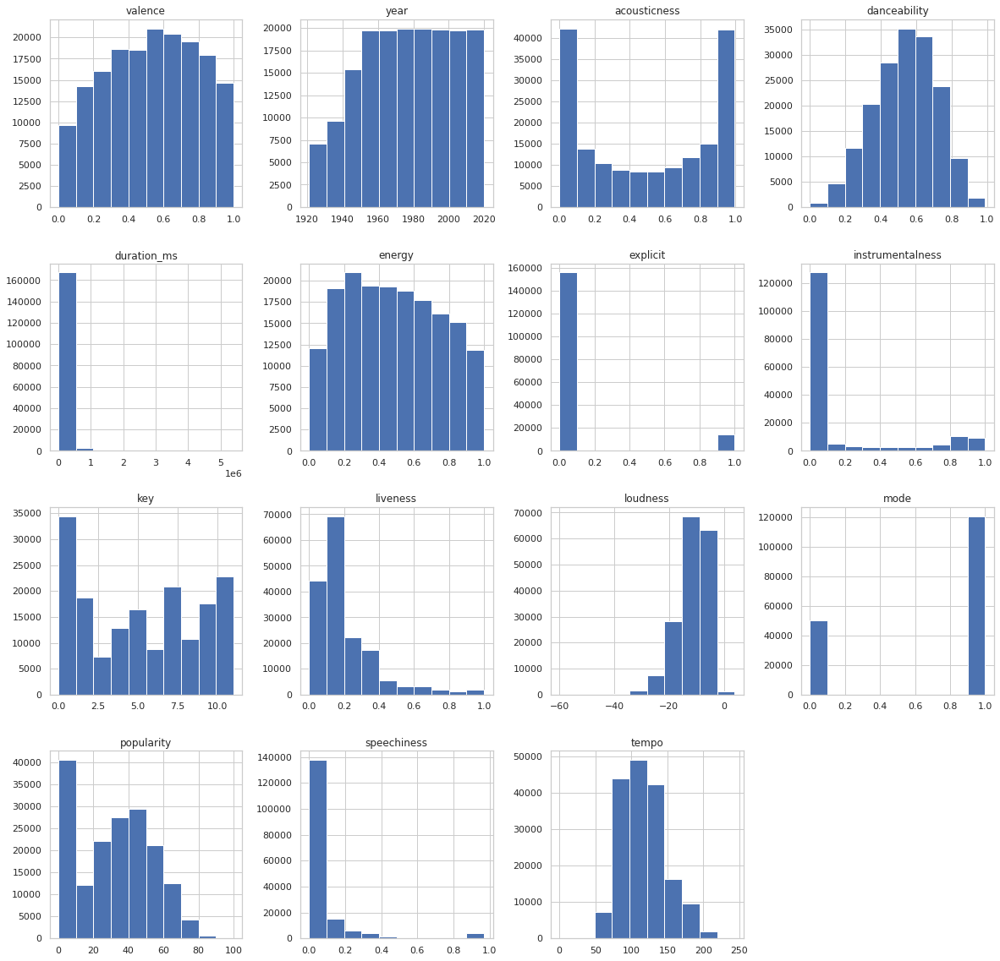

In [25]:
df.hist(figsize=(20, 20))
plt.show()

In [26]:
from sklearn.utils.random import sample_without_replacement
import altair as alt
alt.data_transformers.disable_max_rows()
alt.renderers.enable('default')

# Analyzing samples
sample_size = 15000
idx = sample_without_replacement(df.shape[0], sample_size)

base = alt.Chart(df.iloc[idx]).mark_bar()
fig = alt.vconcat()

val = {'continuous': ['tempo', 'loudness', 'duration_ms', 'year'],'target': ['popularity']}
for p, cols in val.items():
    row = alt.hconcat(title=p)
    for c in cols:
        row |= base.encode(
                alt.X(c, bin=alt.Bin(maxbins=50)),
                alt.Y('count():Q'),
                tooltip=['count():Q'],
            ).properties(
                title=c,
                width=200,
                height=250
        )
    fig &= row
fig

alt.VConcatChart(...)

### Observations:
1. Popularity has a ~45K songs with value = 0!
2. Tempo shows a symmetric distribution centered around 120 bpm with a gap in the range (0,30)
3. Duration seems to exhibit Poission relation
4. loudness shows left skewed distribution
5. year is almost uniformly distributed with a drastic drop occuring around 1940s

### 2. Audio features correlation
#### Observations:
- There is a positive correlation between valence, danceability and energy, loudness
- There seems to be a strong negative correlation between energy, acousticness

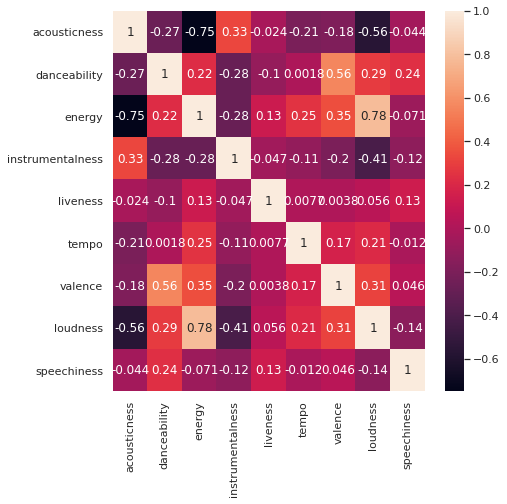

In [27]:
corr = df[["acousticness","danceability","energy", "instrumentalness", 
           "liveness","tempo", "valence", "loudness", "speechiness"]].corr()

plt.figure(figsize=(7,7))
sns.heatmap(corr, annot=True)

### 3. Track audio characteristics
#### Observations:
- All have [0,1] range and mostly exhibit highly non-normal distributions
- instrumentation, speechness, liveness
    - Show highly skewed distribution (heavy right tailed narrow gaussian)
    - Instrumentation and speechiness have a very similar shape
- danceability
    - very flat, symmetric and centered distribution (0.5), with a few outliers
- valence, energy
    - almost uniform distribution
- acousticness
    - very flat symmetric distribution

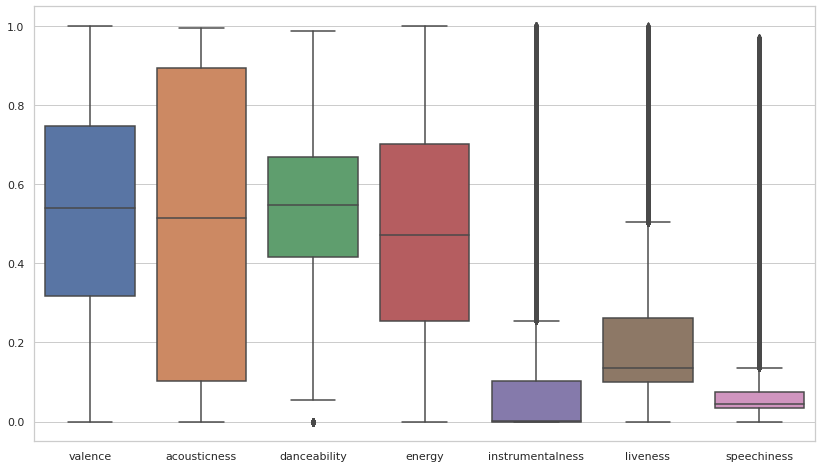

In [28]:
# Considering only song features
fig, ax = plt.subplots(1,1, figsize=(14,8))
sns.boxplot(data=df.select_dtypes([int,float]).drop(['year', 'duration_ms','loudness', 'popularity','tempo', 'key', 'mode', 'explicit'],axis=1),ax=ax,)

### 4. What affects the popularity?

Text(0, 0.5, 'popularity')

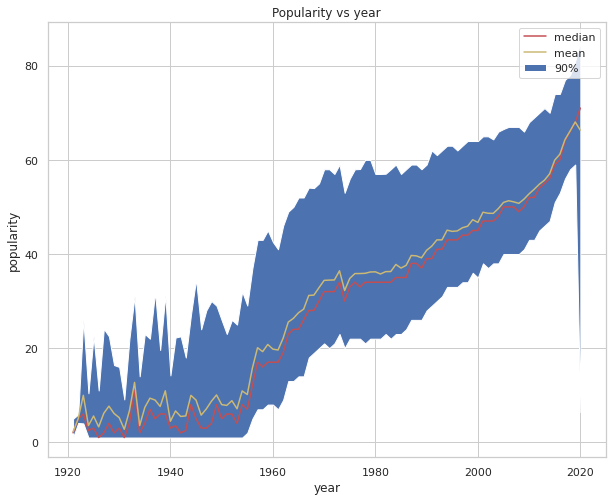

In [29]:
fig, ax  = plt.subplots(1,1,figsize=(10, 8))
min_max_pop_year = (
    df[df.popularity != 0].groupby('year')
        .agg({
            'popularity': [
                lambda x: x.quantile(0.05),
                lambda x: x.quantile(0.95),
                'median',
                'mean',
            ]
        })
        .rename(columns={
            '<lambda_0>': 'min',
            '<lambda_1>': 'max',
        })
)
ax.set_title('Popularity vs year')
ax.fill_between(min_max_pop_year.index, min_max_pop_year['popularity', 'min'], min_max_pop_year['popularity', 'max'], label='90%')
sns.lineplot(x=min_max_pop_year.index, y=min_max_pop_year['popularity','median'], ax=ax, color='r', label='median')
sns.lineplot(x=min_max_pop_year.index, y=min_max_pop_year['popularity','mean'], ax=ax, color='y', label='mean')
plt.legend()
ax.set_ylabel('popularity')

In [30]:
alt.Chart(
    (
        df.iloc[idx].where(lambda r: r.popularity == 0).groupby('year').agg({'id': 'count'}) / 
        df.iloc[idx].groupby('year').agg({'id': 'count'})
    ).fillna(value=0).reset_index().rename(columns={'id': 'percentile'})
).mark_bar().encode(
    x='year',
    y='percentile',
).properties(title='percentile zero popularity', width=600, height=500)

alt.Chart(...)

### 5. Correlation of other features with popularity

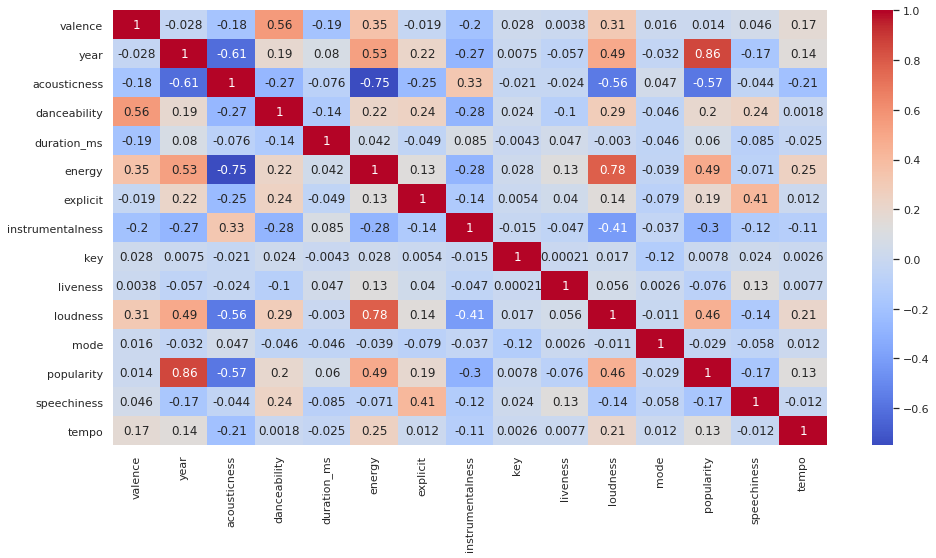

In [31]:
plt.figure(figsize=(16, 8))
sns.set(style="whitegrid")
corr = df.corr()
sns.heatmap(corr,annot=True,cmap="coolwarm")

#### Observations:
- Popularity of tracks strongly depends on the year the music track was produced
- Recent tracks show higher popularity
- positive corr indicates trend in increasing popularity with increasing year
- loudness and energy seems to have positive effect on popularity

### 6. Trend in audio characteristics over time
The dataset contains song from far 1921. We can get an overview how the characteristics of song change over 100 years. Usually by years and technology the instruments in music had a great change. The below table shows the mean values of each feature every year and is illustrated in the plot too

In [43]:
year_avg = df[['danceability','energy','liveness',
               'acousticness','valence','year']].groupby('year').mean().sort_values(by='year').reset_index()
year_avg.tail(10)

,year,danceability,energy,liveness,acousticness,valence
90,2011,0.552867,0.648301,0.203309,0.273183,0.472454
91,2012,0.570882,0.656571,0.189733,0.249953,0.462709
92,2013,0.571148,0.645597,0.199631,0.257488,0.454741
93,2014,0.589948,0.648795,0.191822,0.249313,0.463049
94,2015,0.593774,0.627064,0.188856,0.253952,0.432098
95,2016,0.600202,0.592855,0.181170,0.284171,0.431532
96,2017,0.612217,0.590421,0.191713,0.286099,0.416476
97,2018,0.663500,0.602435,0.176326,0.267633,0.447921
98,2019,0.644814,0.593224,0.172616,0.278299,0.458818
99,2020,0.692904,0.631232,0.178535,0.219931,0.501048


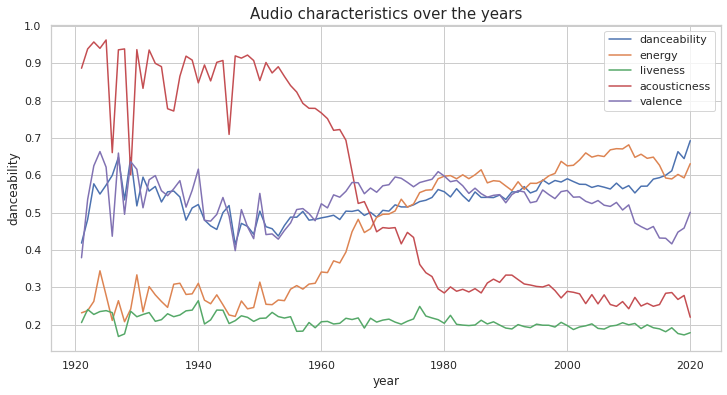

In [33]:
plt.figure(figsize=(12,6))

plt.title("Audio characteristics over the years", fontsize=15)
lines = ['danceability','energy','liveness','acousticness','valence']

for line in lines:
    ax = sns.lineplot(x='year', y=line, data=year_avg)

plt.legend(lines)

#### Observations:
- There is a sharp drop in the acousticness values 
- As seen from the corr plots, more energetic and dancable songs are being made to increase song popularity
- Other characteristics have stayed similar over the years

### 7. Analyzing artists in the dataset
#### Observations:
- There are 34088 artists' contents till date
- Table shows the top 10 artists who have the most songs in the dataset
- These artists have dominated during some time periods shiwn in the plot below

In [34]:
print(df.artists.nunique())
df.artists.value_counts()[:10]

34088


['Эрнест Хемингуэй']      1211
['Эрих Мария Ремарк']     1068
['Francisco Canaro']       942
['Frank Sinatra']          630
['Ignacio Corsini']        628
['Elvis Presley']          504
['Johnny Cash']            484
['Bob Dylan']              474
['The Rolling Stones']     471
['The Beach Boys']         455
Name: artists, dtype: int64

In [35]:
artist_list = df.artists.value_counts().index[:10]
df_artists = df[df.artists.isin(artist_list)][['artists','year','energy']].groupby(['artists','year']).count().reset_index()
df_artists.rename(columns={'energy':'song_count'}, inplace=True)

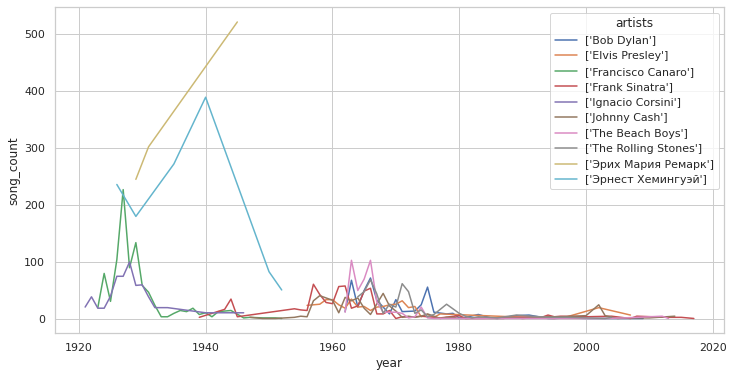

In [36]:
plt.figure(figsize=(12,6))
sns.set(style="whitegrid")
sns.lineplot(x='year', y='song_count', hue='artists', data=df_artists)

### 8. Analyzing most popular tracks, artists

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text major ticklabel objects>)

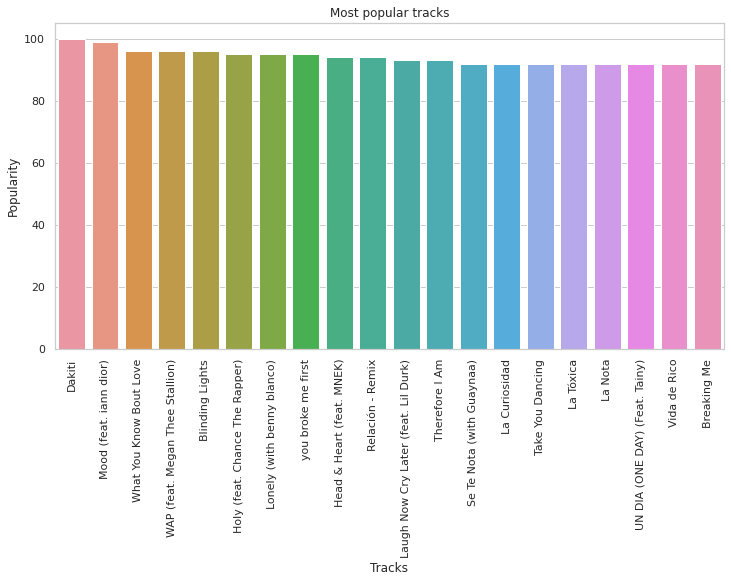

In [37]:
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
x = df.groupby("name")["popularity"].mean().sort_values(ascending=False).head(20)
axis = sns.barplot(x.index, x)
axis.set_title('Most popular tracks')
axis.set_ylabel('Popularity')
axis.set_xlabel('Tracks')
plt.xticks(rotation = 90)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]), <a list of 20 Text major ticklabel objects>)

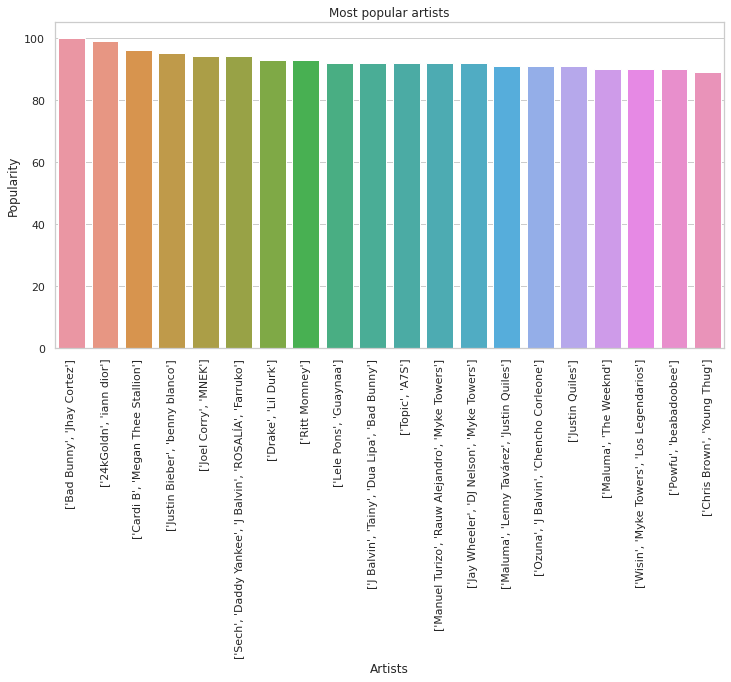

In [38]:
plt.figure(figsize=(12, 6))
sns.set(style="whitegrid")
x = df.groupby("artists")["popularity"].mean().sort_values(ascending=False).head(20)
axis = sns.barplot(x.index, x)
axis.set_title('Most popular artists')
axis.set_ylabel('Popularity')
axis.set_xlabel('Artists')
plt.xticks(rotation = 90)

#### Observations:
- The most popular track is Dakiti closely followed by Mood
- The most popular artists are Bad Bunny & Jhay Cortez for Dakiti

### 9. Song title name
#### Observations:
- Song title name length is left skewed. varies from 2-6 words (Q1, Q3), with median = 4
- Some outliers have 40+ words
- Most commonly occuring words in title name are: Love, live, blue, remaster

In [40]:
df['name_len'] = df['name'].str.split().str.len()
fig1 = px.box(df, y="name_len")
fig1.show()

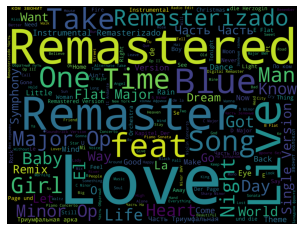

In [41]:
wordcloud = WordCloud(background_color='Black', width=4000,height=3000).generate(" ".join(df.name))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

### 10. Summary statistics
Below shows the stats of all features

In [42]:
df.describe(include='all')

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,name_len
count,170653.000000,170653.000000,170653.000000,170653,170653.000000,1.706530e+05,170653.000000,170653.000000,170653,170653.000000,170653.000000,170653.000000,170653.000000,170653.000000,170653,170653.000000,170653,170653.000000,170653.000000,170653.000000
unique,NaN,NaN,NaN,34088,NaN,NaN,NaN,NaN,170653,NaN,NaN,NaN,NaN,NaN,133638,NaN,11244,NaN,NaN,NaN
top,NaN,NaN,NaN,['Эрнест Хемингуэй'],NaN,NaN,NaN,NaN,59fvJNbJvUZ340IDUsFqxx,NaN,NaN,NaN,NaN,NaN,White Christmas,NaN,1945,NaN,NaN,NaN
freq,NaN,NaN,NaN,1211,NaN,NaN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,73,NaN,1446,NaN,NaN,NaN
mean,0.528587,1976.787241,0.502115,NaN,0.537396,2.309483e+05,0.482389,0.084575,NaN,0.167010,5.199844,0.205839,-11.467990,0.706902,NaN,31.431794,NaN,0.098393,116.861590,4.449901
std,0.263171,25.917853,0.376032,NaN,0.176138,1.261184e+05,0.267646,0.278249,NaN,0.313475,3.515094,0.174805,5.697943,0.455184,NaN,21.826615,NaN,0.162740,30.708533,3.231190
min,0.000000,1921.000000,0.000000,NaN,0.000000,5.108000e+03,0.000000,0.000000,NaN,0.000000,0.000000,0.000000,-60.000000,0.000000,NaN,0.000000,NaN,0.000000,0.000000,1.000000
25%,0.317000,1956.000000,0.102000,NaN,0.415000,1.698270e+05,0.255000,0.000000,NaN,0.000000,2.000000,0.098800,-14.615000,0.000000,NaN,11.000000,NaN,0.034900,93.421000,2.000000
50%,0.540000,1977.000000,0.516000,NaN,0.548000,2.074670e+05,0.471000,0.000000,NaN,0.000216,5.000000,0.136000,-10.580000,1.000000,NaN,33.000000,NaN,0.045000,114.729000,4.000000
75%,0.747000,1999.000000,0.893000,NaN,0.668000,2.624000e+05,0.703000,0.000000,NaN,0.102000,8.000000,0.261000,-7.183000,1.000000,NaN,48.000000,NaN,0.075600,135.537000,6.000000
